# Introduction

## Heart Disease
In this notebook, we will try to answer some questions regarding heart disease as well as try to devise a way to predict whether or not a patient may have heart disease. We will attempt to determine what factors may cause heart disease or at least have some correlation to heart disease.

### What is Heart Disease
Heart disease is a general term that refers to many types of heart conditions, including coronary artery disease (CAD), arrhythmia, heart valve disease, and heart failure. CAD is the most common type of heart disease in the United States. It affects the major blood vessels that supply the heart muscle. Decreased blood flow to the heart can cause a heart attack.

Once diagnosed with heart disease, it can't be cured. However, you can treat the things that contributed to the development of coronary artery disease, which can reduce how the condition impacts your body.

According to CDC statistics:
- One person dies EVERY 33 seconds from Heart Disease in the United States
- 695,000 people in the United States died from heart disease in 2021—that’s 1 in every 5 deaths
- Heart disease cost the United States about $239.9 billion each year from 2018 to 2019.3 This includes the cost of health care services, medicines, and lost productivity due to death

As you can see, Heart Disease is a major worry for alot of people in the United States. It effects many millions of people, either directly or indirectly. Preventing this disease or at least catching it early,  combined with latest treatments and lifestyle changes can result in major strides in longevity of live as well as quality of life well into older age.

# Data Wrangling
Import Data and make any necessary modifications in order to be able to work with the data.

In [1]:
# Import libraries to be used
import pandas as pd

# Read the data from the csv file
df = pd.read_csv('HD_cleaned.csv')
df.head()

,General_Health,Checkup,Exercise,Skin_Cancer,Other_Cancer,Depression,Diabetes,Arthritis,Sex,Age_Category,Height_(cm),Weight_(kg),BMI,Smoking_History,Alcohol_Consumption,Fruit_Consumption,Green_Vegetables_Consumption,FriedPotato_Consumption,Heart_Disease
0,Poor,Within the past 2 years,No,No,No,No,No,Yes,Female,70-74,150,32.66,14.54,Yes,0,30,16,12,No
1,Very Good,Within the past year,No,No,No,No,Yes,No,Female,70-74,165,77.11,28.29,No,0,30,0,4,Yes
2,Very Good,Within the past year,Yes,No,No,No,Yes,No,Female,60-64,163,88.45,33.47,No,4,12,3,16,No
3,Poor,Within the past year,Yes,No,No,No,Yes,No,Male,75-79,180,93.44,28.73,No,0,30,30,8,Yes
4,Good,Within the past year,No,No,No,No,No,No,Male,80+,191,88.45,24.37,Yes,0,8,4,0,No


In [2]:
# Shape
print("Shape:", df.shape)

Shape: (308854, 19)


In [3]:
# Data Types
print("Data Types:")
print(df.dtypes)

Data Types:
General_Health                   object
Checkup                          object
Exercise                         object
Skin_Cancer                      object
Other_Cancer                     object
Depression                       object
Diabetes                         object
Arthritis                        object
Sex                              object
Age_Category                     object
Height_(cm)                       int64
Weight_(kg)                     float64
BMI                             float64
Smoking_History                  object
Alcohol_Consumption               int64
Fruit_Consumption                 int64
Green_Vegetables_Consumption      int64
FriedPotato_Consumption           int64
Heart_Disease                    object
dtype: object


In [4]:
# Missing Data
print("Missing Data:")
print(df.isnull().sum())

Missing Data:
General_Health                  0
Checkup                         0
Exercise                        0
Skin_Cancer                     0
Other_Cancer                    0
Depression                      0
Diabetes                        0
Arthritis                       0
Sex                             0
Age_Category                    0
Height_(cm)                     0
Weight_(kg)                     0
BMI                             0
Smoking_History                 0
Alcohol_Consumption             0
Fruit_Consumption               0
Green_Vegetables_Consumption    0
FriedPotato_Consumption         0
Heart_Disease                   0
dtype: int64


C:\Users\Ramon\AppData\Local\Temp\ipykernel_8068\438238842.py:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df.corr()


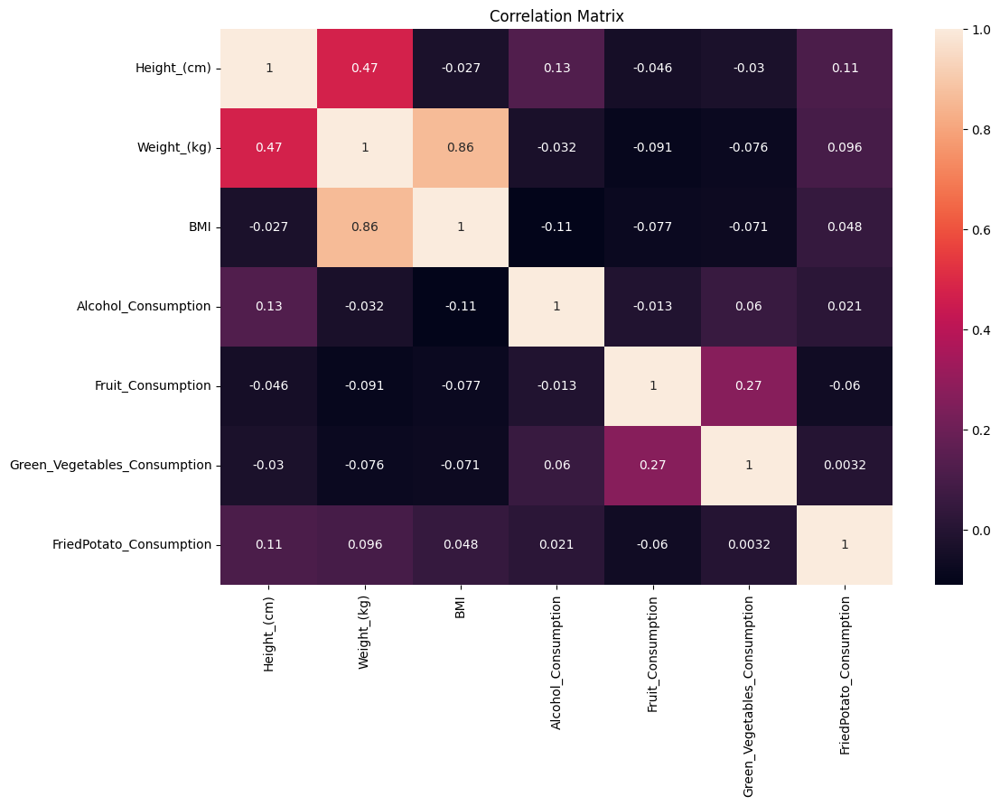

In [5]:
import seaborn as sns
import matplotlib.pyplot as plt

correlation_matrix = df.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True)
plt.title("Correlation Matrix")
plt.show()

In [6]:
from sklearn.model_selection import train_test_split

# Split the data into training (90%) and validation (10%) sets
training_data, validation_data = train_test_split(df, test_size=0.1, random_state=42)

print('Training set:', training_data.shape)
print('Validation set:', validation_data.shape)

Training set: (277968, 19)
Validation set: (30886, 19)


In [10]:
from pycaret.classification import *

# Setup the experiment
clf1 = setup(
    data=training_data,
    target='Heart_Disease',
    normalize=True,
    remove_outliers=True
)

,Description,Value
0,Session id,1974
1,Target,Heart_Disease
2,Target type,Binary
3,Target mapping,"No: 0, Yes: 1"
4,Original data shape,"(277968, 19)"
5,Transformed data shape,"(268239, 42)"
6,Transformed train set shape,"(184848, 42)"
7,Transformed test set shape,"(83391, 42)"
8,Ordinal features,7
9,Numeric features,7


    Since nrows is smaller than dataset, loading random sample of 150000 rows into pandas...
Shape of your Data Set loaded: (150000, 19)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    19 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
Since Number of Rows in data 150000 exceeds maximum, randomly sampling 150000 rows for EDA...
To fix data quality issues automatically, import FixDQ from autoviz...
    Alert: Dropping 25 duplicate rows can sometimes cause column data types to change to object. Double-check!


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
General_Health,object,0.000000,0,nan,nan,No issue
Checkup,object,0.000000,0,nan,nan,1 rare categories: ['Never']. Group them into a single category or drop the categories.
Exercise,object,0.000000,0,nan,nan,No issue
Skin_Cancer,object,0.000000,0,nan,nan,No issue
Other_Cancer,object,0.000000,0,nan,nan,No issue
Depression,object,0.000000,0,nan,nan,No issue
Diabetes,object,0.000000,0,nan,nan,"1 rare categories: ['Yes, but female told only during pregnancy']. Group them into a single category or drop the categories."
Arthritis,object,0.000000,0,nan,nan,No issue
Sex,object,0.000000,0,nan,nan,No issue
Age_Category,object,0.000000,0,nan,nan,No issue


Number of All Scatter Plots = 3


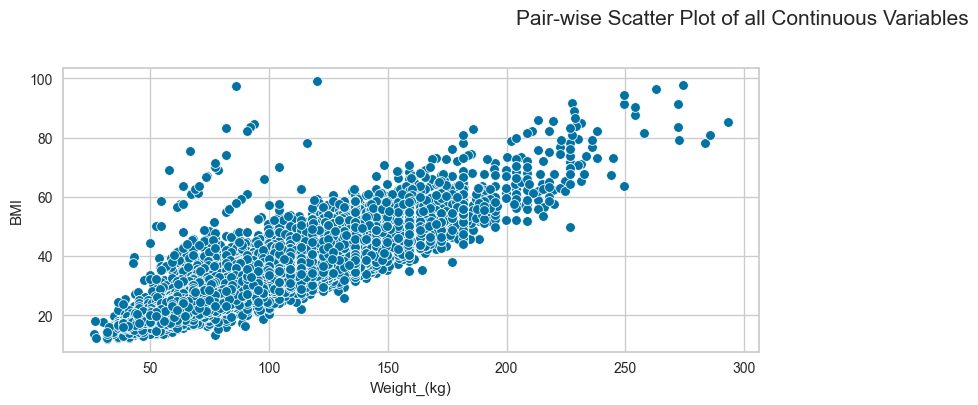

Could not draw Distribution Plot


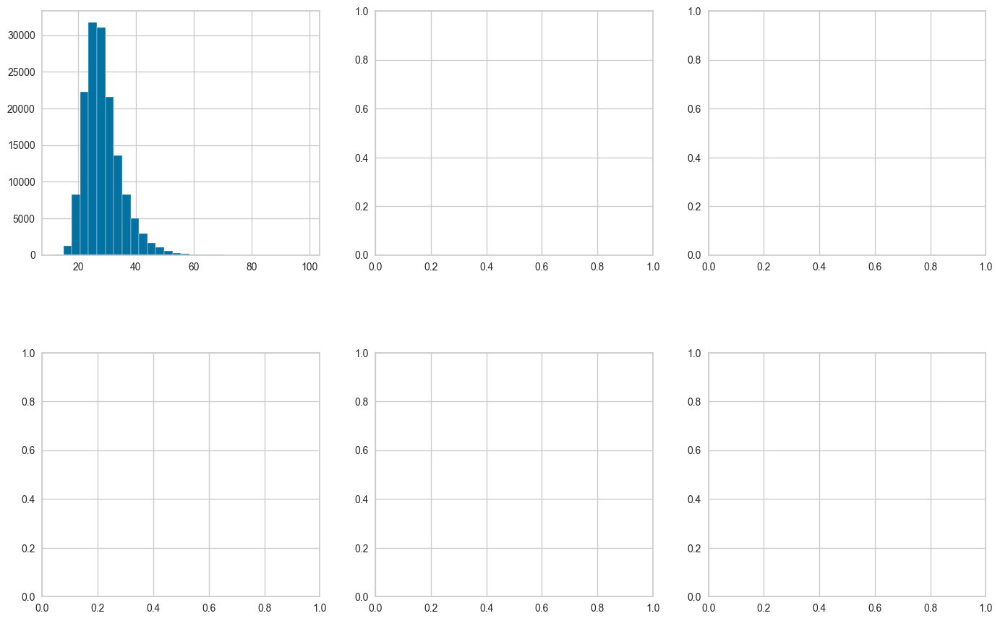

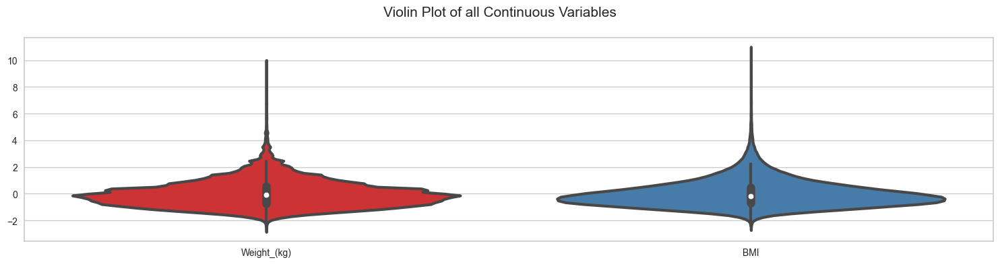

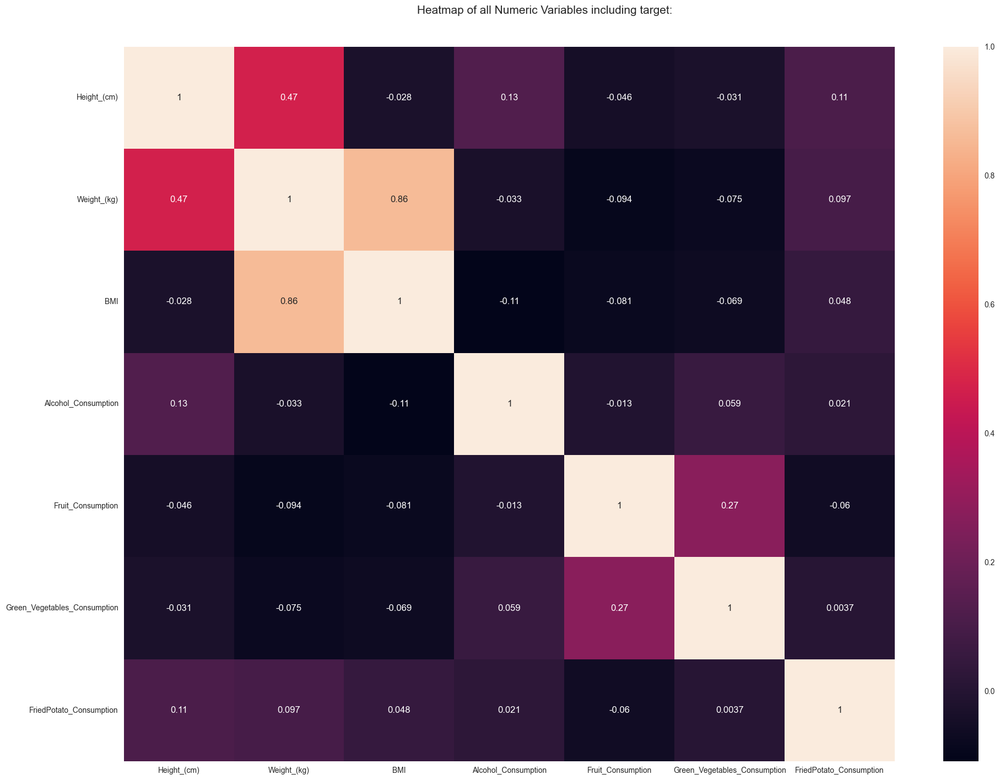

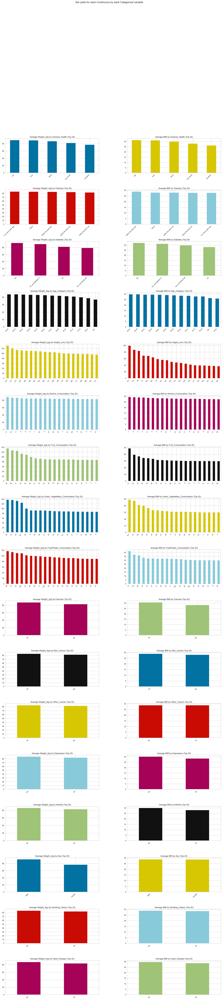

All Plots done
Time to run AutoViz = 7 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [12]:
from autoviz.AutoViz_Class import AutoViz_Class

# Initialize AutoViz
AV = AutoViz_Class()

# Run AutoViz on the training_data DataFrame
report_before_setup = AV.AutoViz(filename="", dfte=training_data, verbose=1)


# Exploratory Data Analysis

In [13]:
# Import EDA profiling report tools
from ydata_profiling import ProfileReport
train_profile = ProfileReport(training_data, title="Profiling Report", dark_mode=True)
train_profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [14]:
train_profile.to_file('Train_HD_EDA_Profile.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [15]:
val_profile = ProfileReport(validation_data, title="Profiling Report", dark_mode=True)
val_profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [16]:
val_profile.to_file('Val_HD_EDA_Profile.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [17]:
# Drop the "Checkup" column
training_data = training_data.drop(columns=['Checkup'])

In [18]:
# Combine 'Yes, but female told only during pregnancy' with 'Yes' in the "Diabetes" column
training_data['Diabetes'] = training_data['Diabetes'].replace('Yes, but female told only during pregnancy', 'Yes')

In [19]:
# Cap the data at the suggested upper and lower bounds
training_data['Height_(cm)'] = training_data['Height_(cm)'].clip(lower=140.5, upper=200.5)
training_data['Weight_(kg)'] = training_data['Weight_(kg)'].clip(lower=27.23, upper=136.06)
training_data['BMI'] = training_data['BMI'].clip(lower=12.77, upper=43.28)
training_data['Alcohol_Consumption'] = training_data['Alcohol_Consumption'].clip(lower=-9, upper=15)
training_data['Fruit_Consumption'] = training_data['Fruit_Consumption'].clip(lower=-15, upper=57)
training_data['Green_Vegetables_Consumption'] = training_data['Green_Vegetables_Consumption'].clip(lower=-20, upper=44)
training_data['FriedPotato_Consumption'] = training_data['FriedPotato_Consumption'].clip(lower=-7, upper=17)

# Preview the training data
training_data.head()

,General_Health,Exercise,Skin_Cancer,Other_Cancer,Depression,Diabetes,Arthritis,Sex,Age_Category,Height_(cm),Weight_(kg),BMI,Smoking_History,Alcohol_Consumption,Fruit_Consumption,Green_Vegetables_Consumption,FriedPotato_Consumption,Heart_Disease
14893,Excellent,Yes,No,No,Yes,No,No,Male,18-24,178.0,58.97,18.65,No,0,12,44,4,No
24750,Poor,Yes,No,No,No,No,Yes,Female,60-64,170.0,77.11,26.63,Yes,4,20,10,10,Yes
58895,Good,Yes,No,Yes,No,No,No,Female,55-59,168.0,68.04,24.21,Yes,15,12,2,12,No
43176,Excellent,Yes,No,No,No,No,No,Male,18-24,175.0,53.52,17.43,No,0,20,15,10,No
147013,Good,Yes,No,No,Yes,No,No,Female,25-29,160.0,56.70,22.14,No,0,30,3,10,No


In [20]:
# Drop the "Checkup" column from the validation data
validation_data = validation_data.drop(columns=['Checkup'])


In [21]:
# Combine 'Yes, but female told only during pregnancy' with 'Yes' in the "Diabetes" column for the validation data
validation_data['Diabetes'] = validation_data['Diabetes'].replace('Yes, but female told only during pregnancy', 'Yes')


In [22]:
# Cap the data at the suggested upper and lower bounds for the validation data
validation_data['Height_(cm)'] = validation_data['Height_(cm)'].clip(lower=140.5, upper=200.5)
validation_data['Weight_(kg)'] = validation_data['Weight_(kg)'].clip(lower=27.23, upper=136.06)
validation_data['BMI'] = validation_data['BMI'].clip(lower=12.77, upper=43.28)
validation_data['Alcohol_Consumption'] = validation_data['Alcohol_Consumption'].clip(lower=-9, upper=15)
validation_data['Fruit_Consumption'] = validation_data['Fruit_Consumption'].clip(lower=-15, upper=57)
validation_data['Green_Vegetables_Consumption'] = validation_data['Green_Vegetables_Consumption'].clip(lower=-20, upper=44)
validation_data['FriedPotato_Consumption'] = validation_data['FriedPotato_Consumption'].clip(lower=-7, upper=17)

# Preview the validation data
validation_data.head()

,General_Health,Exercise,Skin_Cancer,Other_Cancer,Depression,Diabetes,Arthritis,Sex,Age_Category,Height_(cm),Weight_(kg),BMI,Smoking_History,Alcohol_Consumption,Fruit_Consumption,Green_Vegetables_Consumption,FriedPotato_Consumption,Heart_Disease
302051,Very Good,Yes,No,No,No,No,Yes,Male,60-64,178.0,86.18,27.26,No,12,30,16,8,No
59950,Very Good,No,No,No,No,No,Yes,Female,70-74,165.0,79.38,29.12,No,0,57,44,12,No
203639,Good,No,No,No,No,No,Yes,Female,60-64,168.0,72.57,25.82,Yes,6,0,20,0,No
78768,Very Good,Yes,No,No,No,No,No,Male,25-29,183.0,93.89,28.07,Yes,0,57,8,2,No
216156,Fair,Yes,Yes,No,Yes,"No, pre-diabetes or borderline diabetes",Yes,Female,55-59,160.0,54.43,21.26,Yes,0,20,6,15,No


In [24]:
# Dropping the BMI column from both the training and validation datasets
training_data = training_data.drop(columns=['BMI'])
validation_data = validation_data.drop(columns=['BMI'])

# Checking the updated shape of the training and validation datasets
training_data.shape, validation_data.shape


((277968, 17), (30886, 17))

    Since nrows is smaller than dataset, loading random sample of 150000 rows into pandas...
Shape of your Data Set loaded: (150000, 17)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    17 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
Since Number of Rows in data 150000 exceeds maximum, randomly sampling 150000 rows for EDA...
To fix data quality issues automatically, import FixDQ from autoviz...
    Alert: Dropping 48 duplicate rows can sometimes cause column data types to change to object. Double-check!


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
General_Health,object,0.000000,0,nan,nan,No issue
Exercise,object,0.000000,0,nan,nan,No issue
Skin_Cancer,object,0.000000,0,nan,nan,No issue
Other_Cancer,object,0.000000,0,nan,nan,No issue
Depression,object,0.000000,0,nan,nan,No issue
Diabetes,object,0.000000,0,nan,nan,No issue
Arthritis,object,0.000000,0,nan,nan,No issue
Sex,object,0.000000,0,nan,nan,No issue
Age_Category,object,0.000000,0,nan,nan,No issue
Height_(cm),float64,0.000000,NA,140.500000,200.500000,No issue


Number of All Scatter Plots = 3


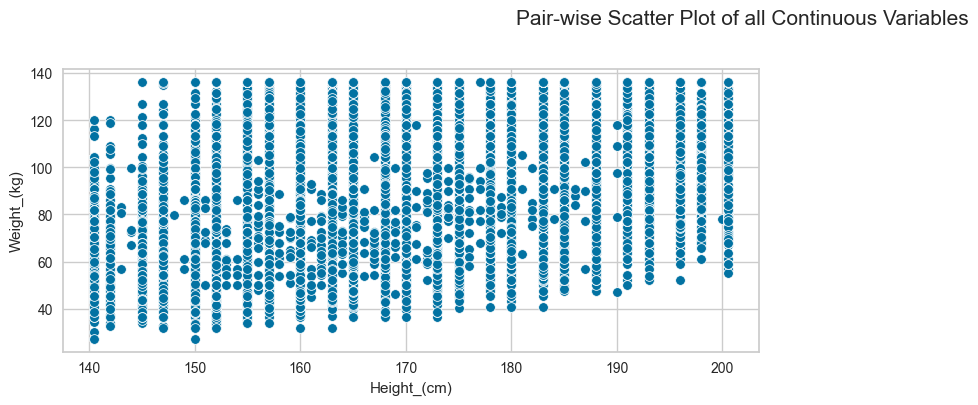

Could not draw Distribution Plot


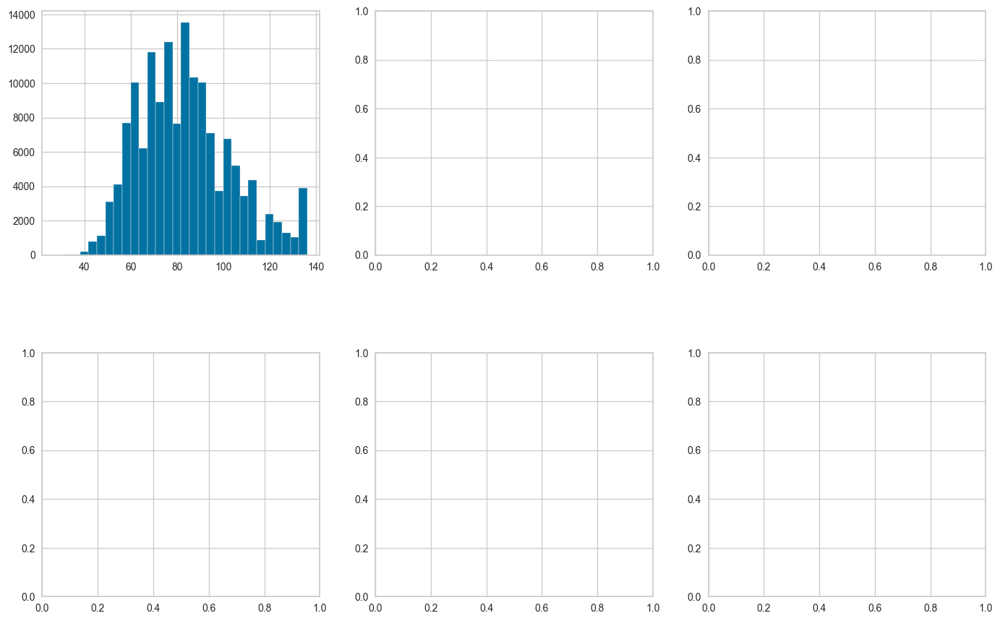

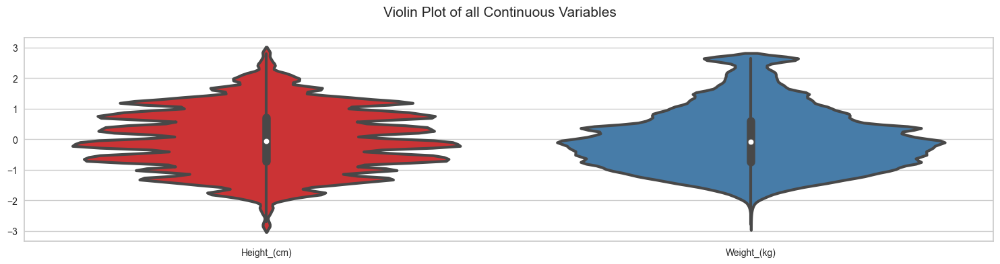

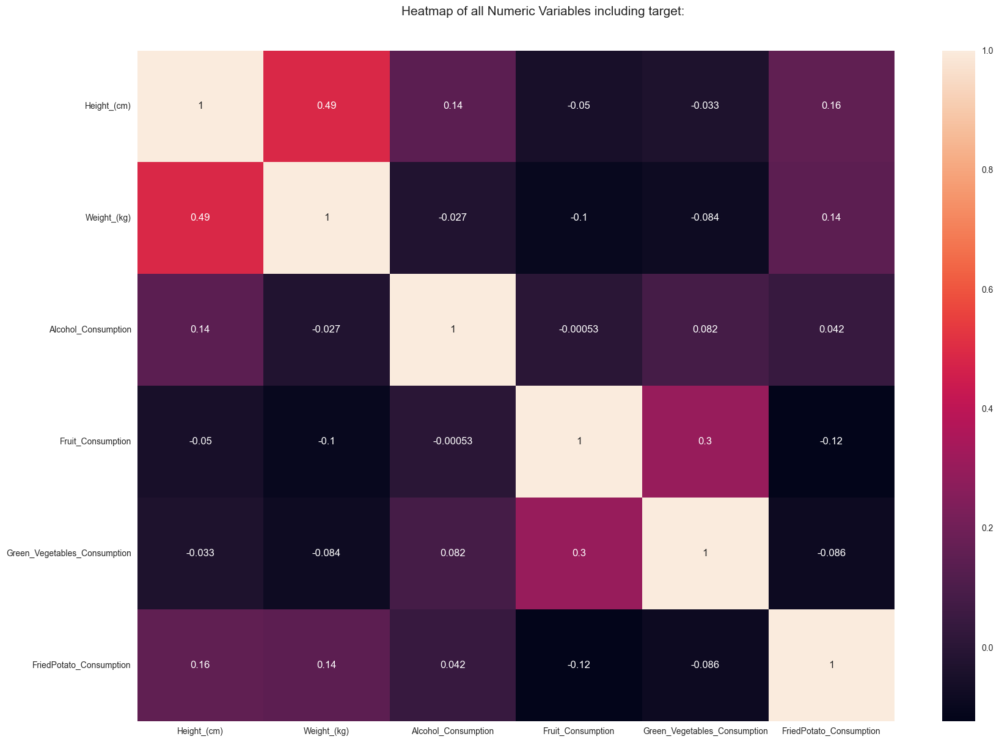

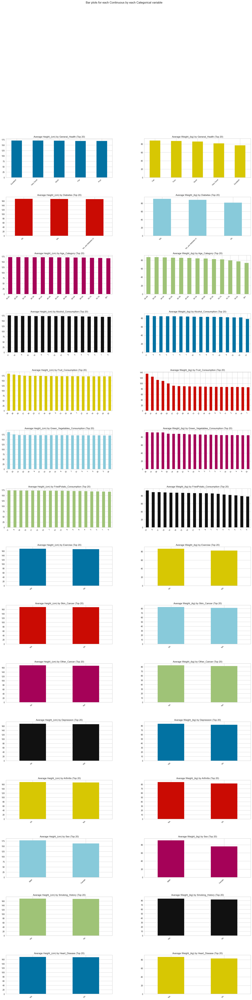

All Plots done
Time to run AutoViz = 7 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [25]:
from autoviz.AutoViz_Class import AutoViz_Class

# Initialize AutoViz
AV = AutoViz_Class()

# Run AutoViz on the training_data DataFrame
report_after_processing = AV.AutoViz(filename="", dfte=training_data, verbose=1)

In [26]:
# Setup the modified experiment
modified_clf = setup(
    data=training_data,
    target='Heart_Disease',
    normalize=True,
    remove_outliers=True
)


,Description,Value
0,Session id,559
1,Target,Heart_Disease
2,Target type,Binary
3,Target mapping,"No: 0, Yes: 1"
4,Original data shape,"(277968, 17)"
5,Transformed data shape,"(268239, 35)"
6,Transformed train set shape,"(184848, 35)"
7,Transformed test set shape,"(83391, 35)"
8,Ordinal features,7
9,Numeric features,6


# Modeling

In [27]:
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.9195,0.8332,0.0291,0.5470,0.0551,0.0473,0.1116,0.7000
lr,Logistic Regression,0.9192,0.8335,0.0656,0.5053,0.1161,0.0993,0.1602,4.0670
gbc,Gradient Boosting Classifier,0.9192,0.8338,0.0552,0.5046,0.0994,0.0848,0.1466,3.5990
svm,SVM - Linear Kernel,0.9191,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.4960
ridge,Ridge Classifier,0.9191,0.0000,0.0001,0.1000,0.0001,0.0001,0.0024,0.4340
dummy,Dummy Classifier,0.9191,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,0.3780
ada,Ada Boost Classifier,0.9187,0.8336,0.0794,0.4859,0.1364,0.1163,0.1718,1.5480
catboost,CatBoost Classifier,0.9185,0.8282,0.0567,0.4697,0.1011,0.0852,0.1415,8.5840
rf,Random Forest Classifier,0.9180,0.8051,0.0428,0.4293,0.0777,0.0640,0.1150,3.0770
xgboost,Extreme Gradient Boosting,0.9180,0.8262,0.0601,0.4518,0.1060,0.0887,0.1417,2.0280


Processing:   0%|          | 0/69 [00:00<?, ?it/s]

In [28]:
from pycaret.classification import create_model, blend_models

# Create individual models
lightgbm_model = create_model('lightgbm')
qda_model = create_model('qda')
nb_model = create_model('nb')

# Blend the models using soft voting
blended_model = blend_models(estimator_list=[lightgbm_model, qda_model, nb_model], method='soft')

# Return blended model
blended_model


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9199,0.8351,0.0273,0.6056,0.0523,0.0456,0.1165
1,0.9199,0.8412,0.0248,0.6290,0.0477,0.0418,0.1137
2,0.9193,0.8284,0.0210,0.5238,0.0403,0.0343,0.0926
3,0.9196,0.8319,0.0273,0.5658,0.0521,0.0450,0.1114
4,0.9198,0.8317,0.0311,0.5833,0.0591,0.0513,0.1213
5,0.9187,0.8314,0.0254,0.4598,0.0481,0.0400,0.0931
6,0.9187,0.8339,0.0222,0.4545,0.0424,0.0351,0.0863
7,0.9195,0.8348,0.0381,0.5357,0.0712,0.0611,0.1269
8,0.9187,0.8320,0.0368,0.4677,0.0683,0.0572,0.1136


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.5207,0.8092,0.9193,0.1359,0.2368,0.1116,0.2218
1,0.5370,0.8170,0.9250,0.1407,0.2443,0.1208,0.2338
2,0.5292,0.8014,0.9047,0.1365,0.2372,0.1124,0.2192
3,0.5051,0.8099,0.9288,0.1332,0.2329,0.1065,0.2181
4,0.4833,0.8099,0.9327,0.1286,0.2260,0.0978,0.2085
5,0.5094,0.8084,0.9276,0.1341,0.2343,0.1082,0.2199
6,0.5576,0.8077,0.9010,0.1437,0.2479,0.1259,0.2336
7,0.4816,0.8171,0.9466,0.1296,0.2281,0.1000,0.2148
8,0.4719,0.8017,0.9346,0.1263,0.2226,0.0934,0.2034


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6435,0.8086,0.8526,0.1668,0.2790,0.1662,0.2645
1,0.6538,0.8173,0.8450,0.1700,0.2831,0.1715,0.2680
2,0.6501,0.8095,0.8418,0.1680,0.2802,0.1679,0.2638
3,0.6444,0.8096,0.8532,0.1672,0.2796,0.1670,0.2654
4,0.6507,0.8092,0.8437,0.1686,0.2810,0.1689,0.2652
5,0.6510,0.8099,0.8406,0.1684,0.2805,0.1684,0.2640
6,0.6522,0.8125,0.8463,0.1696,0.2826,0.1708,0.2676
7,0.6541,0.8185,0.8520,0.1711,0.2850,0.1736,0.2717
8,0.6480,0.8037,0.8399,0.1669,0.2785,0.1660,0.2614


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6367,0.8236,0.8590,0.1649,0.2767,0.1631,0.2629
1,0.6471,0.8326,0.8520,0.1682,0.2809,0.1686,0.2667
2,0.6471,0.8188,0.8482,0.1677,0.2800,0.1675,0.2648
3,0.6362,0.8235,0.8571,0.1645,0.2760,0.1623,0.2617
4,0.6452,0.8235,0.8545,0.1677,0.2804,0.1679,0.2666
5,0.6444,0.8216,0.8489,0.1667,0.2787,0.1658,0.2633
6,0.6496,0.8264,0.8521,0.1693,0.2824,0.1704,0.2685
7,0.6465,0.8272,0.8609,0.1691,0.2826,0.1704,0.2706
8,0.6423,0.8195,0.8501,0.1660,0.2777,0.1646,0.2624


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

VotingClassifier(estimators=[('Light Gradient Boosting Machine',
                              LGBMClassifier(boosting_type='gbdt',
                                             class_weight=None,
                                             colsample_bytree=1.0,
                                             importance_type='split',
                                             learning_rate=0.1, max_depth=-1,
                                             min_child_samples=20,
                                             min_child_weight=0.001,
                                             min_split_gain=0.0,
                                             n_estimators=100, n_jobs=-1,
                                             num_leaves=31, objective=None,
                                             random_state=559, reg_alpha=0.0,
                                             reg_lambda=0.0, subsample=1.0,
                                             subsample_for_bin=200000,
                                             subsample_freq=0)),
                             ('Quadratic Discriminant Analysis',
                              QuadraticDiscriminantAnalysis(priors=None,
                                                            reg_param=0.0,
                                                            store_covariance=False,
                                                            tol=0.0001)),
                             ('Naive Bayes',
                              GaussianNB(priors=None, var_smoothing=1e-09))],
                 flatten_transform=True, n_jobs=-1, verbose=False,
                 voting='soft', weights=None)

In [30]:
from pycaret.classification import evaluate_model

# Assuming 'blended_model' is the variable containing your trained blended model
evaluate_model(blended_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [31]:
from pycaret.classification import tune_model

# Tune the individual models
tuned_lightgbm = tune_model(lightgbm_model, optimize='Recall') # Assuming recall is the desired optimization metric
tuned_qda = tune_model(qda_model, optimize='Recall')
tuned_nb = tune_model(nb_model, optimize='Recall')

# Blend the tuned models
tuned_blended_model = blend_models(estimator_list=[tuned_lightgbm, tuned_qda, tuned_nb], method='soft')

# Evaluate the tuned blended model
evaluate_model(tuned_blended_model)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9173,0.8202,0.0839,0.4400,0.1409,0.1180,0.1648
1,0.9188,0.8241,0.0750,0.4876,0.1300,0.1108,0.1674
2,0.9171,0.8165,0.0623,0.4170,0.1083,0.0892,0.1363
3,0.9183,0.8245,0.0712,0.4686,0.1236,0.1045,0.1586
4,0.9182,0.8205,0.0877,0.4710,0.1478,0.1256,0.1769
5,0.9174,0.8279,0.0603,0.4260,0.1057,0.0873,0.1362
6,0.9167,0.8276,0.0597,0.4034,0.1040,0.0849,0.1302
7,0.9176,0.8226,0.0712,0.4409,0.1225,0.1024,0.1519
8,0.9161,0.8160,0.0775,0.4026,0.1300,0.1067,0.1484


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6380,0.8099,0.8501,0.1643,0.2753,0.1617,0.2595
1,0.6481,0.8183,0.8520,0.1686,0.2814,0.1692,0.2674
2,0.6433,0.8085,0.8424,0.1654,0.2765,0.1633,0.2594
3,0.6361,0.8109,0.8551,0.1642,0.2755,0.1617,0.2607
4,0.6462,0.8087,0.8501,0.1675,0.2799,0.1674,0.2651
5,0.6465,0.8096,0.8432,0.1668,0.2786,0.1658,0.2620
6,0.6464,0.8130,0.8457,0.1671,0.2791,0.1664,0.2632
7,0.6502,0.8191,0.8526,0.1695,0.2828,0.1709,0.2692
8,0.6436,0.8048,0.8450,0.1658,0.2773,0.1642,0.2609


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6435,0.8086,0.8526,0.1668,0.2790,0.1662,0.2645
1,0.6538,0.8173,0.8450,0.1700,0.2831,0.1715,0.2680
2,0.6501,0.8095,0.8418,0.1680,0.2802,0.1679,0.2638
3,0.6444,0.8096,0.8532,0.1672,0.2796,0.1670,0.2654
4,0.6507,0.8092,0.8437,0.1686,0.2810,0.1689,0.2652
5,0.6510,0.8099,0.8406,0.1684,0.2805,0.1684,0.2640
6,0.6522,0.8125,0.8463,0.1696,0.2826,0.1708,0.2676
7,0.6541,0.8185,0.8520,0.1711,0.2850,0.1736,0.2717
8,0.6480,0.8037,0.8399,0.1669,0.2785,0.1660,0.2614


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6375,0.8169,0.8596,0.1653,0.2773,0.1638,0.2638
1,0.6470,0.8258,0.8526,0.1682,0.2810,0.1687,0.2670
2,0.6477,0.8149,0.8501,0.1681,0.2807,0.1684,0.2662
3,0.6366,0.8205,0.8577,0.1647,0.2763,0.1627,0.2622
4,0.6446,0.8185,0.8551,0.1676,0.2802,0.1676,0.2665
5,0.6443,0.8201,0.8489,0.1667,0.2787,0.1658,0.2633
6,0.6493,0.8234,0.8527,0.1693,0.2825,0.1704,0.2687
7,0.6471,0.8226,0.8615,0.1694,0.2831,0.1710,0.2713
8,0.6415,0.8141,0.8507,0.1657,0.2774,0.1642,0.2622


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [34]:
# Predictions using the standard blended model
predictions_standard = predict_model(blended_model, data=validation_data)

# Predictions using the tuned blended model
predictions_tuned = predict_model(tuned_blended_model, data=validation_data)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Voting Classifier,0.6473,0.8304,0.8611,0.1685,0.2819,0.1704,0.2707


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Voting Classifier,0.6474,0.8264,0.8607,0.1685,0.2819,0.1703,0.2705


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


Since there wasn't much of a difference between results of tuned models vs the standard models, at least as far as this project goes, there doesnt appear to be much benefit in using the tuned blended model. Sticking with the standard blended model should suffice, however, if this were to be a production model, of course more further tuning and more data would be required.

In [35]:
# Finalize Model
from pycaret.classification import finalize_model

final_blended_model = finalize_model(blended_model)

In [36]:
# Save model for future use
save_model(blended_model, 'final_blended_model')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=FastMemory(location=C:\Users\Ramon\AppData\Local\Temp\joblib),
          steps=[('label_encoding',
                  TransformerWrapperWithInverse(exclude=None, include=None,
                                                transformer=LabelEncoder())),
                 ('numerical_imputer',
                  TransformerWrapper(exclude=None,
                                     include=['Height_(cm)', 'Weight_(kg)',
                                              'Alcohol_Consumption',
                                              'Fruit_Consumption',
                                              'Green_Vegetables_Consumption'...
                                                               reg_lambda=0.0,
                                                               subsample=1.0,
                                                               subsample_for_bin=200000,
                                                               subsample_freq=0)),
                   

In [40]:
from pycaret.classification import load_model

# Load the saved model
loaded_model = load_model('final_blended_model')

# Predict on the validation set to verify validity of model saved
predictions_loaded_model = predict_model(loaded_model, data=validation_data)

Transformation Pipeline and Model Successfully Loaded


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Voting Classifier,0.6473,0.8304,0.8611,0.1685,0.2819,0.1704,0.2707


# Conclusion

- Accuracy (64.73%): Accuracy indicates the overall percentage of correct predictions made by the model. An accuracy of 64.73% shows that the model is correct roughly two-thirds of the time. This may be considered moderate, depending on the specific application and the balance of the classes.

- AUC (83.04%): The Area Under the Receiver Operating Characteristic Curve (AUC-ROC) is a measure of how well the model can distinguish between the two classes. An AUC of 83.04% suggests a good ability to discriminate between those with and without heart disease.

- Recall (Sensitivity) (86.11%): Recall represents the proportion of actual positive cases (people with heart disease) that were correctly identified by the model. A recall of 86.11% means the model is doing well in identifying most of the actual positive cases.

- Precision (16.85%): Precision represents the proportion of predicted positive cases that were actually positive. A precision of 16.85% is quite low, indicating that a significant number of false positive predictions are made by the model.

- F1 Score (28.19%): The F1 score is the harmonic mean of precision and recall, providing a balance between the two. The relatively low F1 score suggests that the model's balance between precision and recall may not be ideal.

- Kappa (17.04%): Cohen's Kappa measures the agreement between predicted and actual values, corrected for chance. A low kappa score indicates a moderate level of agreement.

- MCC (27.07%): The Matthews Correlation Coefficient (MCC) provides a balanced measure of binary classification performance. An MCC value of 27.07% is moderate, indicating room for improvement.

Summary:
The model is strong in terms of sensitivity, capturing most of the true positive cases.
The low precision indicates a high rate of false positives, where the model incorrectly predicts heart disease.
The moderate accuracy, AUC, and MCC suggest that the model's overall performance is acceptable but could benefit from further tuning or different approaches.
In a medical context like predicting heart disease, achieving high sensitivity is often crucial, as failing to identify a positive case can have serious consequences. However, the low precision means that many individuals might be falsely identified as having heart disease, leading to unnecessary further testing or anxiety.

The blend of models and the chosen method of tuning might need further refinement, focusing on the specific needs of the application and the balance between sensitivity and precision. An understanding of the costs associated with false positives and false negatives would guide this tuning process.

Overall, we have identified factors that demonstrate a significant correlation with heart disease, leading to insights into its potential determinants. The blended model we've constructed shows a commendable ability to predict whether or not someone has heart disease, particularly excelling in sensitivity, where it correctly identifies the majority of positive cases. However, the model's precision is relatively low, indicating a higher rate of false positives. This suggests that while the model can be a valuable tool in initial screenings, further confirmatory testing would likely be necessary to validate the predictions. While the results are promising and statistically significant, there is room for improvement. With more data, further tuning, and perhaps the exploration of other techniques, the model's performance could be enhanced, strengthening its reliability in predicting heart disease based on this dataset.

# Appendix

CDC statistics: https://www.cdc.gov/heartdisease/facts.htm#:~:text=Heart%20Disease%20in%20the%20United%20States&text=One%20person%20dies%20every%2033,United%20States%20from%20cardiovascular%20disease.&text=About%20695%2C000%20people%20in%20the,1%20in%20every%205%20deaths.

